In [2]:
# Import main packages
import sys, os
sys.path.insert(1, os.path.abspath('..') )
from ECO import diagnostics as eco
from ECO.utils import config_parser, open_datasets, get_namelist
import xarray as xr
import xgcm
import numpy as np

# Import matplotlib for plotting and functions to override default values
import matplotlib.pyplot as plt
#from ECOanalysis import update_plotstyle, cmap_OB
#cmap_OB=cmap_OB(); update_plotstyle()

In [3]:
# exp_prefix = ['EXP00','EXP00','EXP00','EXP01','EXP01','EXP01','EXP02','EXP02','EXP02']    # Import all files with this prefix
# exp_suffix = ['_1d10','_5d50','_1m500','_1d10','_5d50','_1m500','_1d10','_5d50','_1m500',]
exp_prefix = ['EXP00','EXP00','EXP01','EXP01','EXP02','EXP02']    # Import all files with this prefix
exp_suffix = ['_1d10','_5d50','_1d10','_5d50','_1d10','_5d50']
# exp_prefix = ['EXP02','EXP02']    # Import all files with this prefix
# exp_suffix = ['_1d10','_5d50']
#timestep_slice = {'_6h1440':None, '_12h720':None, '_1d10':(0,360)}
ds = open_datasets(exp_prefix, exp_suffix, components = ['metrics','moc'])

HDF5-DIAG: Error detected in HDF5 (1.12.2) MPI-process 0:
  #000: H5A.c line 528 in H5Aopen_by_name(): can't open attribute
    major: Attribute
    minor: Can't open object
  #001: H5VLcallback.c line 1091 in H5VL_attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #002: H5VLcallback.c line 1058 in H5VL__attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #003: H5VLnative_attr.c line 130 in H5VL__native_attr_open(): can't open attribute
    major: Attribute
    minor: Can't open object
  #004: H5Aint.c line 545 in H5A__open_by_name(): unable to load attribute info from object header
    major: Attribute
    minor: Unable to initialize object
  #005: H5Oattribute.c line 476 in H5O__attr_open_by_name(): can't open attribute
    major: Attribute
    minor: Can't open object
  #006: H5Adense.c line 394 in H5A__dense_open(): can't locate attribute in name index
    major: Attribute
    minor: Object

In [5]:
# get base configuration of EXP00
kwargs={}
for i in range(len(exp_prefix)): kwargs[exp_prefix[i]+exp_suffix[i]] = config_parser(exp_prefix[i])
#for exp in exp_suffix: kwargs[exp_prefix+exp] = config_parser(exp_prefix)
#if kwargs_sim['get_namelist']: kwargs_sim['namelist'] = get_namelist(path = kwargs_proc['path_nemo'])

# define xgcm configuration based on dataset metrics
_metrics = {('X',): ['e1tm', 'e1um', 'e1vm', 'e1fm'],
     ('Y',): ['e2tm', 'e2um', 'e2vm', 'e2fm'],
     ('Z',): ['e3tm', 'e3um', 'e3vm', 'e3wm']}

grid = {exp: xgcm.Grid(ds[exp], metrics=_metrics, periodic=False) for exp in ds} # define xgcm grid
grid_ops = {exp: eco.Grid_ops(grid[exp], maskargs={'mask':'nan'}) for exp in ds} # define gridoperations.+
grid = {exp: grid_ops[exp]._update({'Z':ds[exp]['e3tm_1d']}) for exp in ds}
        
properties= {exp: eco.Properties(grid_ops[exp], {'X': ds[exp].glamt, 'Y': ds[exp].gphit, 'Z': ds[exp].depth_1d}, eos_properties=kwargs[exp][2]['eos']) for exp in ds}
energetics= {exp: eco.Energetics(grid_ops[exp], properties[exp]) for exp in ds}

Using processing configuration base.yml
Using processing configuration base.yml
Using processing configuration base.yml
Using processing configuration base.yml
Using processing configuration base.yml
Using processing configuration base.yml


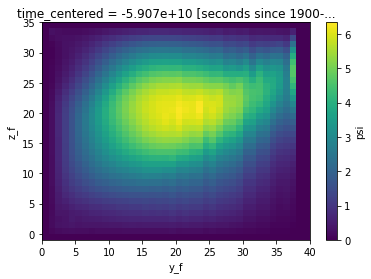

In [20]:
%matplotlib inline 
ds['EXP01_1d10'].psi[10].plot()

In [8]:
for _suffix in set(exp_suffix):
    print(_suffix)
    print('TMOC | %.3E %.3E %.3E'%tuple([ds[exp].psi_tmoc.mean('t').values for exp in ds if _suffix in exp]))
    print('DMOC | %.3E %.3E %.3E'%tuple([ds[exp].psi_dmoc.mean('t').values for exp in ds if _suffix in exp]))
    print('\n------------------------\n')

_5d50
TMOC | 9.649E+00 3.461E+00 9.817E+00


DMOC | 5.389E+00 6.411E+00 7.998E+00

------------------------

_1d10
TMOC | 9.649E+00 3.393E+00 9.818E+00
DMOC | 5.434E+00 6.302E+00 8.041E+00

------------------------



In [5]:
for _suffix in set(exp_suffix):
    print(_suffix)
    print('P    | %.3E  %.3E  %.3E'%tuple([P[exp].mean('t').values for exp in P if _suffix in exp]))
    print('K    | %.3E  %.3E  %.3E'%tuple([K[exp].mean('t').values for exp in K if _suffix in exp]))
    print('H    | %.3E  %.3E  %.3E'%tuple([H[exp].mean('t').values for exp in H if _suffix in exp]))
    print('H0   | %.3E  %.3E  %.3E'%tuple([H0[exp].mean('t').values for exp in H0 if _suffix in exp]))
    print('DH   | %.3E  %.3E  %.3E'%tuple([DH[exp].mean('t').values for exp in DH if _suffix in exp]))
    print('\n')
    print('z_v  | %.3E  %.3E  %.3E'%tuple([ds[exp].zg_0.mean('t').values for exp in ds if _suffix in exp]))
    print('z_g  | %.3E  %.3E  %.3E'%tuple([ds[exp].zgDE.mean('t').values for exp in ds if _suffix in exp]))
    print('z_g0 | %.3E  %.3E  %.3E'%tuple([ds[exp].zgDE_gm.mean('t').values for exp in ds if _suffix in exp]))
    print('Dz_g | %.3E  %.3E  %.3E'%tuple([(ds[exp].zgDE-ds[exp].zgDE_gm).mean('t').values for exp in ds if _suffix in exp]))
    print('\n------------------------\n')

_1m500
P    | -1.776E+24  -1.776E+24  -1.775E+24
K    | 2.002E+16  6.584E+15  2.157E+16
H    | -3.288E+20  -3.041E+20  -2.134E+20
H0   | -9.467E+19  -9.270E+19  4.093E+03
DH   | -2.341E+20  -2.114E+20  -2.134E+20


z_v  | -1.997E+03  -1.997E+03  -1.997E+03
z_g  | -3.706E-01  -3.428E-01  -2.405E-01
z_g0 | -1.067E-01  -1.045E-01  4.613E-18
Dz_g | -2.639E-01  -2.383E-01  -2.405E-01

------------------------

_5d50
P    | -1.776E+24  -1.776E+24  -1.775E+24
K    | 1.997E+16  6.594E+15  2.152E+16
H    | -3.284E+20  -3.042E+20  -2.135E+20
H0   | -9.467E+19  -9.270E+19  -1.021E+03
DH   | -2.338E+20  -2.116E+20  -2.135E+20


z_v  | -1.997E+03  -1.997E+03  -1.997E+03
z_g  | -3.702E-01  -3.429E-01  -2.406E-01
z_g0 | -1.067E-01  -1.045E-01  -1.151E-18
Dz_g | -2.635E-01  -2.384E-01  -2.406E-01

------------------------

_1d10
P    | -1.776E+24  -1.776E+24  -1.775E+24
K    | 1.998E+16  6.490E+15  2.149E+16
H    | -3.285E+20  -3.041E+20  -2.134E+20
H0   | -9.467E+19  -9.269E+19  -3.247E+03
DH   | -2.